In [40]:
import os
import sys
import math
import json
from typing import List, Dict, Optional, Tuple

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
import plotly.express as px
from scipy.spatial import cKDTree

import seaborn as sns
import osmnx as ox


In [20]:
df = pd.read_csv("Data/CrashStatisticsFranklinCounty.csv")

C:\Users\raab.75\AppData\Local\Temp\ipykernel_30348\1550891691.py:1: DtypeWarning: Columns (23,31) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("Data/CrashStatisticsFranklinCounty.csv")


In [9]:
df

,LocalReportNumber,DocumentNumber,CrashSeverity,HitSkip,LocalInformation,SecondaryCrash,PhotosTaken,OH2,OH3,OH1P,...,PedestrianRelated,SemiTruckRelated,SmallTruckRelated,YouthRelated,TeenRelated,DUI21Related,SeniorRelated,FatalNotReportable,CommercialRelated,CommercialAtFault
0,\t20183624,20202168971,Fatal,NaN,NaN,False,True,True,True,True,...,True,False,True,False,False,False,False,False,False,False
1,\t20179633,20202168999,Fatal,NaN,NaN,False,False,True,False,True,...,False,True,True,False,False,False,True,False,True,True
2,\t20179416,20202172825,Fatal,NaN,NaN,False,True,True,False,False,...,False,False,True,True,False,False,False,False,False,False
3,\t20193278,20202183697,Fatal,Unsolved,NaN,False,True,True,True,False,...,True,False,False,False,False,False,True,False,False,False
4,\t20214201,20202206898,Fatal,NaN,NaN,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115676,\t202501180,20258172808,Property Damage Only,NaN,NaN,False,True,True,False,False,...,False,False,False,False,False,False,False,False,False,False
115677,\t25whi-22254-AC,20258173076,Property Damage Only,NaN,NaN,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
115678,\t25WHI-22233-AC,20258173087,Injury Possible,NaN,NaN,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
115679,\t25WHI-21784-AC,20258173091,Property Damage Only,Unsolved,NaN,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [21]:
# Check how many duplicate rows exist
# we do not seem to have duplicates, nice
num_duplicates = df.duplicated().sum()
print(f"Number of duplicate rows: {num_duplicates}")

Number of duplicate rows: 0


In [22]:
'''
issue: we have about 850 rows where the coordinates are Nan, but location can be backtraced using 

Latitude
Longitude
LocationRouteType
LocationRouteNumber
LocationPrefix
LocationRoadName
LocationRoadType
DistanceFromReference
DistanceReferenceMeasurement
DirectionFromReference
ReferenceRouteType
ReferenceRouteNumber
ReferencePrefix
ReferenceName
ReferencePointUsed
ReferenceRoadType

However, out of 115681 total data points in Franklin County, this is less than 1%, so, we shall drop those lines
'''

# Count NaNs in specific columns
nan_counts = df[["Latitude", "Longitude"]].isna().sum()
print(nan_counts)

# Select rows with missing coordinates
missing_coords = df[df["Latitude"].isna() | df["Longitude"].isna()]

# Print the first 5 rows
columns_to_show = ["Latitude", "Longitude", "LocationRouteType", "LocationRouteNumber", "LocationPrefix", "LocationRoadName", "ReferenceName", "ReferencePointUsed", "DistanceReferenceMeasurement"]
print(missing_coords[columns_to_show].head(5))  # first 10 rows


# here we drop all rows that contain no coordinate info
df= df.dropna(subset=["Latitude", "Longitude"])


Latitude     839
Longitude    850
dtype: int64
      Latitude  Longitude LocationRouteType LocationRouteNumber  \
4408       NaN        NaN               NaN                 NaN   
4447       NaN        NaN       State Route                 161   
4573       NaN        NaN               NaN                 NaN   
4619       NaN        NaN               NaN                 NaN   
4649       NaN        NaN               NaN                 NaN   

     LocationPrefix LocationRoadName ReferenceName ReferencePointUsed  \
4408            NaN       STRINGTOWN           NaN       Intersection   
4447            NaN              NaN      EITERMAN       Intersection   
4573            NaN         COMODITY       LASALLE       Intersection   
4619            NaN       STRINGTOWN      MCDOWELL       Intersection   
4649           West          SCHROCK            55       House Number   

     DistanceReferenceMeasurement  
4408                         Feet  
4447                        Yards  
457

In [33]:
# Convert longitude and latitute to radians
coords = np.radians(df[["Latitude", "Longitude"]].values)

kms_per_radian = 6371.0088
epsilon = 0.01 / kms_per_radian   # 20 m in km, converted to radians

db = DBSCAN(eps=epsilon, min_samples=1, algorithm="ball_tree", metric="haversine").fit(coords)
df["cluster"] = db.labels_

# Aggregate crashes by cluster
clustered = df.groupby("cluster").agg({
    "Latitude": "mean",
    "Longitude": "mean",
    "cluster": "count"
}).rename(columns={"cluster": "count"}).reset_index(drop=True)

# Plot clusters on a map
fig = px.scatter_map(
    clustered,
    lat="Latitude", lon="Longitude",
    size="count", color="count",
    size_max=20, zoom=9,
    map_style="carto-positron"
)
fig.show()

In [ ]:
#there are some strange very large clusters on that map, but that might be a representation issue. Problem for later, zooming in on map gives a reasonable picture

max_count = clustered["count"].max()
largest_clusters = clustered[clustered["count"] == max_count]

print("Largest cluster(s):")
print(largest_clusters)

largest_cluster_ids = df.loc[df["cluster"].isin(largest_clusters.index), "cluster"]

largest_rows = df[df["cluster"].isin(largest_cluster_ids)]

#
#some additional large cluster info 
location_cols = [
    "LocationRouteType",
    "LocationRouteNumber",
    "LocationPrefix",
    "LocationRoadName",
    "LocationRoadType",
    "DistanceFromReference",
    "DistanceReferenceMeasurement",
    "DirectionFromReference",
    "ReferenceRouteType",
    "ReferenceRouteNumber",
    "ReferencePrefix",
    "ReferenceName",
    "ReferencePointUsed",
    "ReferenceRoadType"
]

print(largest_rows[location_cols].drop_duplicates())

Largest cluster(s):
       Latitude  Longitude  count
3660  40.099587 -83.109123    203
       LocationRouteType LocationRouteNumber LocationPrefix  LocationRoadName  \
4424         State Route                 161            NaN               NaN   
4518    Federal US Route                  33            NaN               NaN   
4759    Federal US Route                  33            NaN               NaN   
4877         State Route                  33            NaN               NaN   
4920         State Route                 257            NaN               NaN   
5576                 NaN                 NaN            NaN         RIVERSIDE   
24076        State Route                 161            NaN               NaN   
24495                NaN                 NaN           West  DUBLIN-GRANVILLE   
26290        State Route                 257            NaN               NaN   
26904        State Route                 161            NaN               NaN   
28945        State Ro

In [ ]:

# Get Franklin County boundary
franklin = ox.geocode_to_gdf("Franklin County, Ohio, USA")

# Get all fast-food drive-through locations
fastfood = ox.features_from_place(
    "Franklin County, Ohio, USA",
    tags={"amenity": "fast_food", "drive_through": "yes"}
)

#more strict filtering... before this line also banks with drive through showed up
fastfood = fastfood[(fastfood["amenity"]=="fast_food") & (fastfood["drive_through"]=="yes")]

# Extract coordinates
fastfood["lat"] = fastfood.geometry.centroid.y
fastfood["lon"] = fastfood.geometry.centroid.x


import plotly.express as px

fig = px.scatter_map(
    fastfood,
    lat="lat",
    lon="lon",
    hover_name="name",       # optional, if 'name' column exists
    zoom=9,                  # adjust zoom to fit Franklin County
    size_max=10,
    map_style="carto-positron",
    title="Fast-Food Drive-Throughs in Franklin County"
)

fig.show()

C:\Users\raab.75\AppData\Local\Temp\ipykernel_30348\3937852510.py:16: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


C:\Users\raab.75\AppData\Local\Temp\ipykernel_30348\3937852510.py:17: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.




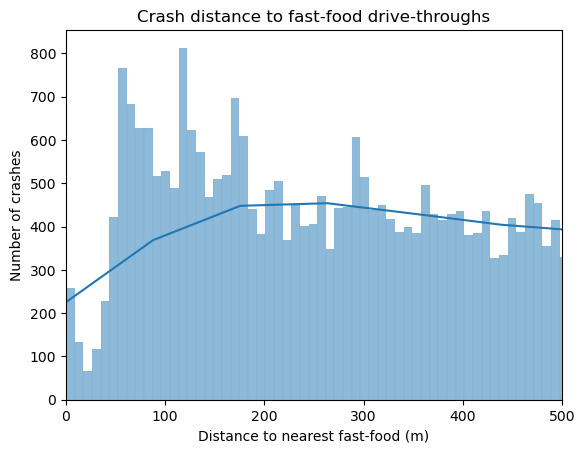

In [44]:

# Build KD-tree of fast-food locations
tree = cKDTree(fastfood[["lat", "lon"]].to_numpy())

# Query nearest fast-food for each crash
crash_coords = df[["Latitude", "Longitude"]].to_numpy()
distances, indices = tree.query(crash_coords, k=1)

# Add distance to nearest fast-food to crash DataFrame
df["distance_to_fastfood_m"] = distances * 111_000  # approx meters

threshold_m = 50  # 100 meters
df["near_fastfood"] = df["distance_to_fastfood_m"] <= threshold_m


sns.histplot(df["distance_to_fastfood_m"], bins=2000, kde=True)
plt.xlim([0,500])
plt.xlabel("Distance to nearest fast-food (m)")
plt.ylabel("Number of crashes")
plt.title("Crash distance to fast-food drive-throughs")
plt.show()

In [45]:
fig = px.scatter_map(
    df,
    lat="Latitude",
    lon="Longitude",
    color="near_fastfood",
    hover_data=["distance_to_fastfood_m"],
    zoom=9,
    map_style="carto-positron",
    title="Crashes near Fast-Food Drive-Throughs in Franklin County"
)
fig.show()

In [46]:
num_near = df["near_fastfood"].sum()
print(f"Number of crashes near fast-food drive-throughs: {num_near}")

Number of crashes near fast-food drive-throughs: 1081


In [47]:
# First, make sure the column is a datetime type
df["CrashReportedDateTime"] = pd.to_datetime(
    df["CrashReportedDateTime"], 
    format="%m/%d/%Y %I:%M:%S %p"
)
# Extract hour in 24h format
df["hour"] = df["CrashReportedDateTime"].dt.hour

# Check
df[["CrashReportedDateTime", "hour"]].head()

,CrashReportedDateTime,hour
0,2020-10-05 20:08:00,20
1,2020-09-29 11:37:00,11
2,2020-09-29 01:16:00,1
3,2020-10-20 20:27:00,20
4,2020-11-21 04:57:00,4


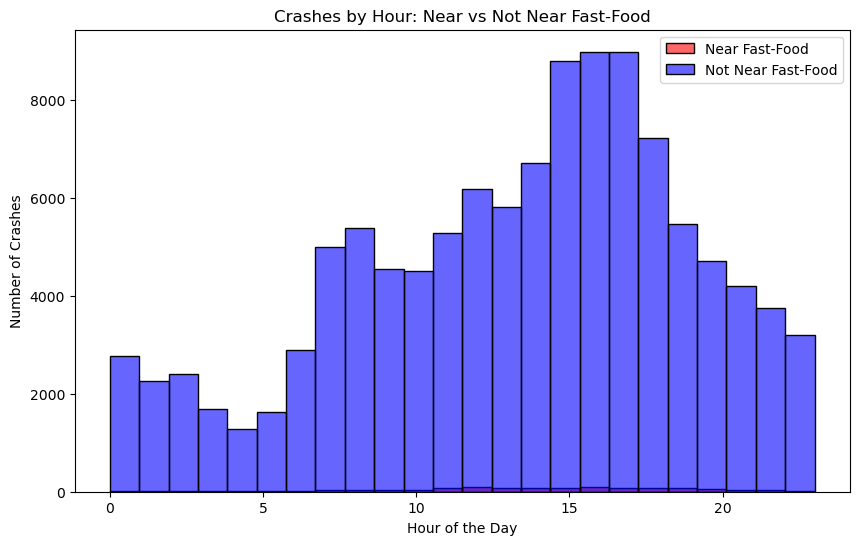

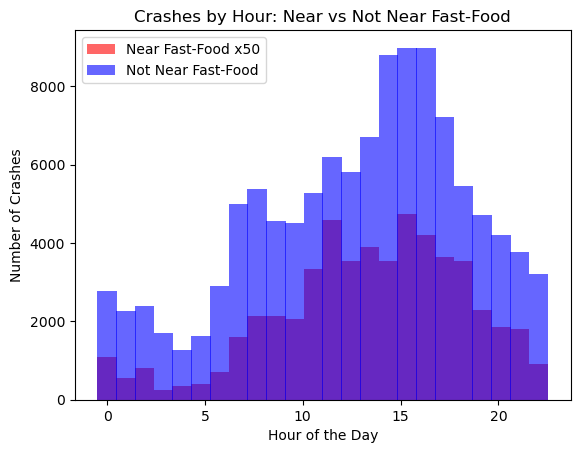

In [54]:
near = df[df["near_fastfood"] == True]
not_near = df[df["near_fastfood"] == False]
# Add a 'weight' column


plt.figure(figsize=(10,6))

# Plot histogram for crashes near fast-food
sns.histplot(near["hour"], bins=24, color="red", alpha=0.6, label="Near Fast-Food")

# Plot histogram for crashes not near fast-food
sns.histplot(not_near["hour"], bins=24, color="blue", alpha=0.6, label="Not Near Fast-Food")

plt.xlabel("Hour of the Day")
plt.ylabel("Number of Crashes")
plt.title("Crashes by Hour: Near vs Not Near Fast-Food")
plt.legend()
plt.show()

# Histogram for Near Fast-Food, scaled by factor 10
counts, bins = np.histogram(near["hour"], bins=24)
plt.bar(bins[:-1], counts*50, width=1, color="red", alpha=0.6, label="Near Fast-Food x50")

# Histogram for Not Near Fast-Food
counts_not, bins_not = np.histogram(not_near["hour"], bins=24)
plt.bar(bins_not[:-1], counts_not, width=1, color="blue", alpha=0.6, label="Not Near Fast-Food")

plt.xlabel("Hour of the Day")
plt.ylabel("Number of Crashes")
plt.title("Crashes by Hour: Near vs Not Near Fast-Food")
plt.legend()
plt.show()

Correlation between IntersectionOrApproachRelated and near_fastfood: -0.011


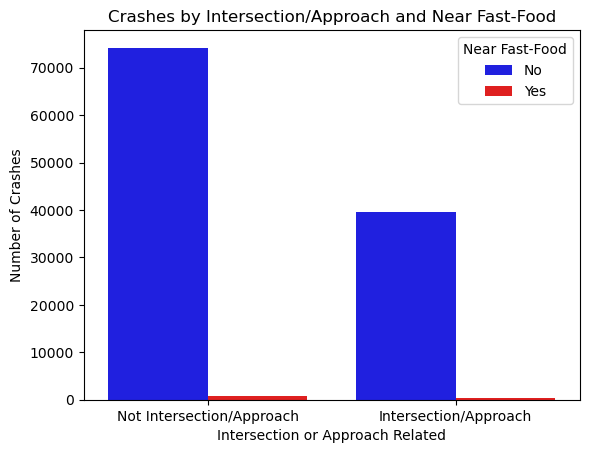

In [57]:
df["IntersectionOrApproachRelated_int"] = df["IntersectionOrApproachRelated"].astype(int)
df["near_fastfood_int"] = df["near_fastfood"].astype(int)

corr = df["IntersectionOrApproachRelated_int"].corr(df["near_fastfood_int"])
print(f"Correlation between IntersectionOrApproachRelated and near_fastfood: {corr:.3f}")

# Compute counts for each combination
counts = df.groupby(["near_fastfood", "IntersectionOrApproachRelated"]).size().reset_index(name="count")


# Define palette explicitly mapping True/False to colors
palette = {False: "blue", True: "red"}

sns.barplot(
    data=counts,
    x="IntersectionOrApproachRelated",
    y="count",
    hue="near_fastfood",
    palette=palette
)

plt.xticks([0,1], ["Not Intersection/Approach", "Intersection/Approach"])
plt.xlabel("Intersection or Approach Related")
plt.ylabel("Number of Crashes")
plt.title("Crashes by Intersection/Approach and Near Fast-Food")

# Update legend manually to show Yes/No with colors
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(handles, ["No", "Yes"], title="Near Fast-Food")

plt.show()

C:\Users\raab.75\AppData\Local\Temp\ipykernel_30348\293530984.py:26: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




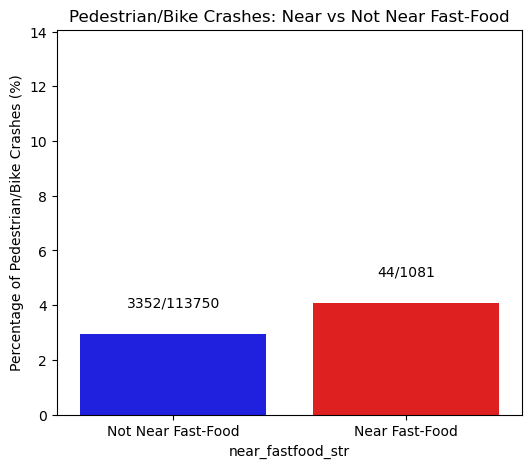

In [60]:
# Convert to int in case they are boolean
df["BicycleRelated_int"] = df["BicycleRelated"].astype(int)
df["PedestrianRelated_int"] = df["PedestrianRelated"].astype(int)

# Combine: 1 if either bicycle or pedestrian involved
df["PedOrBikeInvolved"] = (df["BicycleRelated_int"] | df["PedestrianRelated_int"]).astype(int)

# Compute counts and percentages
summary = (
    df.groupby("near_fastfood")["PedOrBikeInvolved"]
    .agg(['sum','count'])
    .reset_index()
)
summary['percent'] = summary['sum'] / summary['count'] * 100


percentages = (
    df.groupby("near_fastfood")["PedOrBikeInvolved"]
    .mean() * 100  # convert to percentage
).reset_index()

summary['near_fastfood_str'] = summary['near_fastfood'].astype(str)
palette = {"False": "blue", "True": "red"}

plt.figure(figsize=(6,5))
bars = sns.barplot(
    data=summary,
    x="near_fastfood_str",
    y="percent",
    palette=palette
)

# Add absolute numbers
for i, row in summary.iterrows():
    bars.text(
        i,
        row['percent'] + 1,
        f"{row['sum']}/{row['count']}",
        ha='center'
    )

plt.xticks([0,1], ["Not Near Fast-Food", "Near Fast-Food"])
plt.ylabel("Percentage of Pedestrian/Bike Crashes (%)")
plt.title("Pedestrian/Bike Crashes: Near vs Not Near Fast-Food")
plt.ylim(0, max(summary['percent']) + 10)
plt.show()


In [ ]:
#lets search the narratives of ALL crashes for fast-food related keywords
import re 
narratives = pd.read_csv("Data/CrashStatisticsFranklinCountyNarrative.csv")

# Get unique names, removing duplicates
fastfood_names = fastfood["name"].dropna().unique()
fastfood_names_list = sorted(fastfood_names)
print(fastfood_names_list)

#to avoid apostrophes in fast food chain names
pattern = "|".join(re.escape(name).replace(r"\'", r"[’']?") for name in fastfood_names_list)

mask = narratives["Narrative"].str.contains(pattern, case=False, na=False)

# Subset DataFrame
narratives_fastfood = narratives[mask]

narratives["mentions_fastfood"] = mask

# Preview
print(f"Number of narratives mentioning fast-food places: {len(narratives_fastfood)}")
print(narratives_fastfood.head(10))  # first 10 matches



['Acropolis Gyro Palace', "Arby's", "Bojangles'", 'Burger King', "Captain D's", 'Charleys Philly Steaks', 'Chick-fil-A', "Church's Chicken", "Culver's", 'DQ Grill & Chill', 'Dairy Queen', 'Double Dragon Restaurant', "Dunkin'", "Dunkin' Donuts", "Fazoli's", 'Greek Express', 'Gyro Express', "Hardee's", "Jimmy John's", 'Jolly Pirate Donuts', 'KFC', 'Krispy Kreme', "Long John Silver's", "Mark Pi's Express", "Massey's Pizza", "McDonald's", 'Mr. Hero', 'Panda Express', 'Panera Bread', 'Popeyes', 'Popeyes Louisiana Kitchen', "Raising Cane's", "Rally's", 'Shake Shack', 'Sonic', "Steak 'n Shake", 'Subway', 'Taco Bell', "Wendy's", 'White Castle', 'WingStreet']
Number of narratives mentioning fast-food places: 407
                                                                                                                                                                                                                                                                                               